### Cloning [**simplif-ai**](https://github.com/namanshrimali/simplif-ai.git
A library which have all the boilerplate codes available as a module, a one stop solution to jump start deep learning 

In [ ]:
!git clone https://github.com/namanshrimali/simplif-ai.git
!pip install -U albumentations
%cd simplif-ai

%matplotlib inline 
# This turns on inline plotting, where plot graphics will appear in notebook.

fatal: destination path 'simplif-ai' already exists and is not an empty directory.
Requirement already up-to-date: albumentations in /usr/local/lib/python3.6/dist-packages (0.5.2)
/content/simplif-ai


In [ ]:
from util.devices import find_device
from data_action.data_loader import *
from util.image_plot import plot_images
from model.resnet import ResNet18
from learning.train import train
from learning.validate import test
from util.mean_std_calc import calc_mean_std
from util.graph_plot import plot_me

The output of torchvision datasets are PILImage images of range [0, 1].
We transform them to Tensors of normalized range [-1, 1].



In [ ]:
device = find_device()
batch_size = 100
dataset = 'CIFAR10' 

mean, std = calc_mean_std(dataset) # calculates mean and standard deviation of the dataset

data_loader = Data_Loader(device, batch_size, dataset = dataset, mean = mean, std = std, transform_type='mmda')

trainloader = data_loader.load_training_data()
testloader = data_loader.load_testing_data()

classes = ('plane', 'car', 'bird', 'cat',
           'deer', 'dog', 'frog', 'horse', 'ship', 'truck')

target_layers = ["layer1", "layer2", "layer3", "layer4"]


device: cuda

Files already downloaded and verified
Mean: [0.49139884 0.48215783 0.44653153], Std: [0.20230089 0.19941294 0.200962  ]
Loading training data. Dataset: CIFAR10
Files already downloaded and verified
Training data loaded

Loading testing data.
Files already downloaded and verified
Test data loaded



Let us show some of the training images, for fun.



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

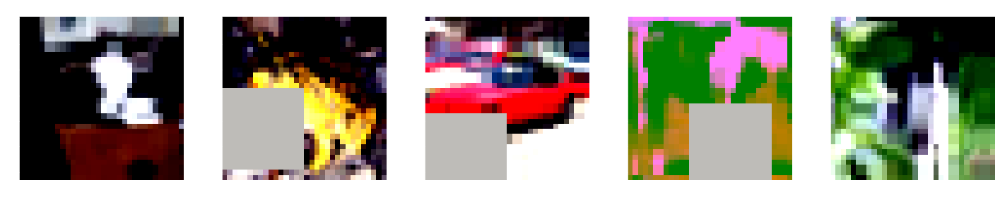

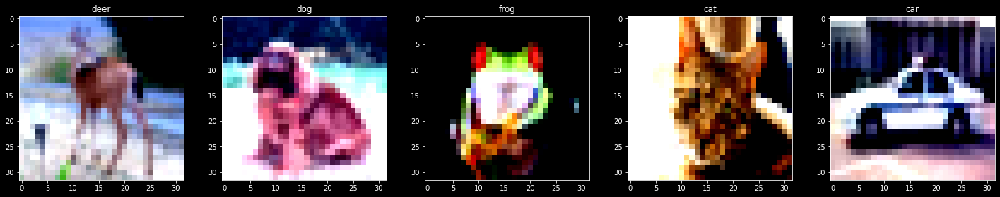

In [ ]:

# get some random training images
dataiter = iter(trainloader)
images, labels = dataiter.next()

# show images and their labels
plot_images(dataiter, classes, total=5)

# get some random testing images
dataiter = iter(testloader)
images, labels = dataiter.next()

# show images and their labels
plot_images(dataiter, classes, total=5)


2. Define a Convolution Neural Network
^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
Copy the neural network from the Neural Networks section before and modify it to
take 3-channel images (instead of 1-channel images as it was defined).



In [ ]:
net = ResNet18(0.1).to(device) # configuring 10% dropout in the resnet-18

### Model summary

In [ ]:
!pip install torchsummary
from torchsummary import summary

summary(net, input_size=(3, 32, 32))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 32, 32]           1,728
       BatchNorm2d-2           [-1, 64, 32, 32]             128
            Conv2d-3           [-1, 64, 32, 32]          36,864
       BatchNorm2d-4           [-1, 64, 32, 32]             128
           Dropout-5           [-1, 64, 32, 32]               0
            Conv2d-6           [-1, 64, 32, 32]          36,864
       BatchNorm2d-7           [-1, 64, 32, 32]             128
           Dropout-8           [-1, 64, 32, 32]               0
        BasicBlock-9           [-1, 64, 32, 32]               0
           Conv2d-10           [-1, 64, 32, 32]          36,864
      BatchNorm2d-11           [-1, 64, 32, 32]             128
          Dropout-12           [-1, 64, 32, 32]               0
           Conv2d-13           [-1, 64, 32, 32]          36,864
      BatchNorm2d-14           [-1, 64,

### Training model
> * defining Stochastic Gradient Descent as optimizer
> * defining scheduler with step size as 8 and gamma of 0.5
---





  0%|          | 0/500 [00:00<?, ?it/s]

Adjusting learning rate of group 0 to 2.0000e-01.
Epoch: 1


loss=1.8299057483673096 batch_id=499: 100%|██████████| 500/500 [04:07<00:00,  2.02it/s]


\Train set: Accuracy: 11153/50000 (22.3060%)



  0%|          | 0/500 [00:00<?, ?it/s]


Test set: Average loss: 1.7212, Accuracy: 3562/10000 (35.62%)

Adjusting learning rate of group 0 to 2.0000e-01.
Epoch: 2


loss=1.4438385963439941 batch_id=499: 100%|██████████| 500/500 [04:07<00:00,  2.02it/s]


\Train set: Accuracy: 17975/50000 (35.9500%)



  0%|          | 0/500 [00:00<?, ?it/s]


Test set: Average loss: 1.4612, Accuracy: 4542/10000 (45.42%)

Adjusting learning rate of group 0 to 2.0000e-01.
Epoch: 3


loss=1.33897066116333 batch_id=499: 100%|██████████| 500/500 [04:08<00:00,  2.02it/s]


\Train set: Accuracy: 21606/50000 (43.2120%)



  0%|          | 0/500 [00:00<?, ?it/s]


Test set: Average loss: 1.4560, Accuracy: 4978/10000 (49.78%)

Adjusting learning rate of group 0 to 2.0000e-01.
Epoch: 4


loss=1.4795222282409668 batch_id=499: 100%|██████████| 500/500 [04:08<00:00,  2.01it/s]


\Train set: Accuracy: 24763/50000 (49.5260%)



  0%|          | 0/500 [00:00<?, ?it/s]


Test set: Average loss: 1.1382, Accuracy: 6006/10000 (60.06%)

Adjusting learning rate of group 0 to 2.0000e-01.
Epoch: 5


loss=1.2022721767425537 batch_id=499: 100%|██████████| 500/500 [04:04<00:00,  2.04it/s]


\Train set: Accuracy: 27719/50000 (55.4380%)



  0%|          | 0/500 [00:00<?, ?it/s]


Test set: Average loss: 1.0686, Accuracy: 6303/10000 (63.03%)

Adjusting learning rate of group 0 to 2.0000e-01.
Epoch: 6


loss=1.1810303926467896 batch_id=499: 100%|██████████| 500/500 [04:04<00:00,  2.05it/s]


\Train set: Accuracy: 29974/50000 (59.9480%)



  0%|          | 0/500 [00:00<?, ?it/s]


Test set: Average loss: 0.9526, Accuracy: 6690/10000 (66.90%)

Adjusting learning rate of group 0 to 2.0000e-01.
Epoch: 7


loss=0.8323326706886292 batch_id=499: 100%|██████████| 500/500 [04:04<00:00,  2.04it/s]


\Train set: Accuracy: 31847/50000 (63.6940%)



  0%|          | 0/500 [00:00<?, ?it/s]


Test set: Average loss: 0.9141, Accuracy: 6755/10000 (67.55%)

Adjusting learning rate of group 0 to 2.0000e-01.
Epoch: 8


loss=1.0010976791381836 batch_id=499: 100%|██████████| 500/500 [04:07<00:00,  2.02it/s]


\Train set: Accuracy: 33361/50000 (66.7220%)



  0%|          | 0/500 [00:00<?, ?it/s]


Test set: Average loss: 0.7421, Accuracy: 7473/10000 (74.73%)

Adjusting learning rate of group 0 to 1.0000e-01.
Epoch: 9


loss=0.7179038524627686 batch_id=499: 100%|██████████| 500/500 [04:06<00:00,  2.03it/s]


\Train set: Accuracy: 35765/50000 (71.5300%)



  0%|          | 0/500 [00:00<?, ?it/s]


Test set: Average loss: 0.6315, Accuracy: 7819/10000 (78.19%)

Adjusting learning rate of group 0 to 1.0000e-01.
Epoch: 10


loss=0.5779795050621033 batch_id=499: 100%|██████████| 500/500 [04:06<00:00,  2.03it/s]


\Train set: Accuracy: 36381/50000 (72.7620%)



  0%|          | 0/500 [00:00<?, ?it/s]


Test set: Average loss: 0.5998, Accuracy: 7948/10000 (79.48%)

Adjusting learning rate of group 0 to 1.0000e-01.
Epoch: 11


loss=0.6852916479110718 batch_id=499: 100%|██████████| 500/500 [04:06<00:00,  2.03it/s]


\Train set: Accuracy: 37179/50000 (74.3580%)



  0%|          | 0/500 [00:00<?, ?it/s]


Test set: Average loss: 0.5998, Accuracy: 7945/10000 (79.45%)

Adjusting learning rate of group 0 to 1.0000e-01.
Epoch: 12


loss=0.5866563320159912 batch_id=499: 100%|██████████| 500/500 [04:03<00:00,  2.05it/s]


\Train set: Accuracy: 37645/50000 (75.2900%)



  0%|          | 0/500 [00:00<?, ?it/s]


Test set: Average loss: 0.5517, Accuracy: 8077/10000 (80.77%)

Adjusting learning rate of group 0 to 1.0000e-01.
Epoch: 13


loss=0.6735994815826416 batch_id=499: 100%|██████████| 500/500 [04:01<00:00,  2.07it/s]


\Train set: Accuracy: 38176/50000 (76.3520%)



  0%|          | 0/500 [00:00<?, ?it/s]


Test set: Average loss: 0.5228, Accuracy: 8205/10000 (82.05%)

Adjusting learning rate of group 0 to 1.0000e-01.
Epoch: 14


loss=0.5985831022262573 batch_id=499: 100%|██████████| 500/500 [03:58<00:00,  2.09it/s]


\Train set: Accuracy: 38508/50000 (77.0160%)



  0%|          | 0/500 [00:00<?, ?it/s]


Test set: Average loss: 0.5158, Accuracy: 8249/10000 (82.49%)

Adjusting learning rate of group 0 to 1.0000e-01.
Epoch: 15


loss=0.5305221080780029 batch_id=499: 100%|██████████| 500/500 [03:58<00:00,  2.10it/s]


\Train set: Accuracy: 38962/50000 (77.9240%)



  0%|          | 0/500 [00:00<?, ?it/s]


Test set: Average loss: 0.4954, Accuracy: 8352/10000 (83.52%)

Adjusting learning rate of group 0 to 1.0000e-01.
Epoch: 16


loss=0.787158727645874 batch_id=499: 100%|██████████| 500/500 [04:01<00:00,  2.07it/s]


\Train set: Accuracy: 39315/50000 (78.6300%)



  0%|          | 0/500 [00:00<?, ?it/s]


Test set: Average loss: 0.5009, Accuracy: 8252/10000 (82.52%)

Adjusting learning rate of group 0 to 5.0000e-02.
Epoch: 17


loss=0.40075892210006714 batch_id=499: 100%|██████████| 500/500 [04:05<00:00,  2.03it/s]


\Train set: Accuracy: 40393/50000 (80.7860%)



  0%|          | 0/500 [00:00<?, ?it/s]


Test set: Average loss: 0.4605, Accuracy: 8435/10000 (84.35%)

Adjusting learning rate of group 0 to 5.0000e-02.
Epoch: 18


loss=0.5084997415542603 batch_id=499: 100%|██████████| 500/500 [04:07<00:00,  2.02it/s]


\Train set: Accuracy: 40759/50000 (81.5180%)



  0%|          | 0/500 [00:00<?, ?it/s]


Test set: Average loss: 0.4272, Accuracy: 8585/10000 (85.85%)

Adjusting learning rate of group 0 to 5.0000e-02.
Epoch: 19


loss=0.371756374835968 batch_id=499: 100%|██████████| 500/500 [04:07<00:00,  2.02it/s]


\Train set: Accuracy: 41017/50000 (82.0340%)



  0%|          | 0/500 [00:00<?, ?it/s]


Test set: Average loss: 0.4240, Accuracy: 8602/10000 (86.02%)

Adjusting learning rate of group 0 to 5.0000e-02.
Epoch: 20


loss=0.5472548007965088 batch_id=499: 100%|██████████| 500/500 [04:08<00:00,  2.02it/s]


\Train set: Accuracy: 41241/50000 (82.4820%)



  0%|          | 0/500 [00:00<?, ?it/s]


Test set: Average loss: 0.4340, Accuracy: 8555/10000 (85.55%)

Adjusting learning rate of group 0 to 5.0000e-02.
Epoch: 21


loss=0.6098526120185852 batch_id=499: 100%|██████████| 500/500 [04:07<00:00,  2.02it/s]


\Train set: Accuracy: 41495/50000 (82.9900%)



  0%|          | 0/500 [00:00<?, ?it/s]


Test set: Average loss: 0.4237, Accuracy: 8587/10000 (85.87%)

Adjusting learning rate of group 0 to 5.0000e-02.
Epoch: 22


loss=0.587429404258728 batch_id=499: 100%|██████████| 500/500 [04:07<00:00,  2.02it/s]


\Train set: Accuracy: 41632/50000 (83.2640%)



  0%|          | 0/500 [00:00<?, ?it/s]


Test set: Average loss: 0.4142, Accuracy: 8619/10000 (86.19%)

Adjusting learning rate of group 0 to 5.0000e-02.
Epoch: 23


loss=0.41673076152801514 batch_id=499: 100%|██████████| 500/500 [04:08<00:00,  2.02it/s]


\Train set: Accuracy: 41857/50000 (83.7140%)



  0%|          | 0/500 [00:00<?, ?it/s]


Test set: Average loss: 0.3964, Accuracy: 8718/10000 (87.18%)

Adjusting learning rate of group 0 to 5.0000e-02.
Epoch: 24


loss=0.45064082741737366 batch_id=499: 100%|██████████| 500/500 [04:07<00:00,  2.02it/s]


\Train set: Accuracy: 42016/50000 (84.0320%)



  0%|          | 0/500 [00:00<?, ?it/s]


Test set: Average loss: 0.4063, Accuracy: 8655/10000 (86.55%)

Adjusting learning rate of group 0 to 2.5000e-02.
Epoch: 25


loss=0.4065067172050476 batch_id=499: 100%|██████████| 500/500 [04:08<00:00,  2.01it/s]


\Train set: Accuracy: 42837/50000 (85.6740%)



  0%|          | 0/500 [00:00<?, ?it/s]


Test set: Average loss: 0.3858, Accuracy: 8730/10000 (87.30%)

Adjusting learning rate of group 0 to 2.5000e-02.
Epoch: 26


loss=0.3402111828327179 batch_id=499: 100%|██████████| 500/500 [04:07<00:00,  2.02it/s]


\Train set: Accuracy: 42898/50000 (85.7960%)



  0%|          | 0/500 [00:00<?, ?it/s]


Test set: Average loss: 0.3771, Accuracy: 8770/10000 (87.70%)

Adjusting learning rate of group 0 to 2.5000e-02.
Epoch: 27


loss=0.3725876212120056 batch_id=499: 100%|██████████| 500/500 [04:08<00:00,  2.02it/s]


\Train set: Accuracy: 43117/50000 (86.2340%)



  0%|          | 0/500 [00:00<?, ?it/s]


Test set: Average loss: 0.3759, Accuracy: 8749/10000 (87.49%)

Adjusting learning rate of group 0 to 2.5000e-02.
Epoch: 28


loss=0.33861687779426575 batch_id=499: 100%|██████████| 500/500 [04:09<00:00,  2.00it/s]


\Train set: Accuracy: 43205/50000 (86.4100%)



  0%|          | 0/500 [00:00<?, ?it/s]


Test set: Average loss: 0.3765, Accuracy: 8767/10000 (87.67%)

Adjusting learning rate of group 0 to 2.5000e-02.
Epoch: 29


loss=0.3186163306236267 batch_id=499: 100%|██████████| 500/500 [04:09<00:00,  2.00it/s]


\Train set: Accuracy: 43371/50000 (86.7420%)



  0%|          | 0/500 [00:00<?, ?it/s]


Test set: Average loss: 0.3765, Accuracy: 8821/10000 (88.21%)

Adjusting learning rate of group 0 to 2.5000e-02.
Epoch: 30


loss=0.2766817808151245 batch_id=499: 100%|██████████| 500/500 [04:09<00:00,  2.00it/s]


\Train set: Accuracy: 43570/50000 (87.1400%)



  0%|          | 0/500 [00:00<?, ?it/s]


Test set: Average loss: 0.3744, Accuracy: 8804/10000 (88.04%)

Adjusting learning rate of group 0 to 2.5000e-02.
Epoch: 31


loss=0.26292914152145386 batch_id=499: 100%|██████████| 500/500 [04:08<00:00,  2.01it/s]


\Train set: Accuracy: 43616/50000 (87.2320%)



  0%|          | 0/500 [00:00<?, ?it/s]


Test set: Average loss: 0.3808, Accuracy: 8806/10000 (88.06%)

Adjusting learning rate of group 0 to 2.5000e-02.
Epoch: 32


loss=0.23418329656124115 batch_id=499: 100%|██████████| 500/500 [04:09<00:00,  2.00it/s]


\Train set: Accuracy: 43623/50000 (87.2460%)



  0%|          | 0/500 [00:00<?, ?it/s]


Test set: Average loss: 0.3723, Accuracy: 8813/10000 (88.13%)

Adjusting learning rate of group 0 to 1.2500e-02.
Epoch: 33


loss=0.31851622462272644 batch_id=499: 100%|██████████| 500/500 [04:10<00:00,  1.99it/s]


\Train set: Accuracy: 44077/50000 (88.1540%)



  0%|          | 0/500 [00:00<?, ?it/s]


Test set: Average loss: 0.3598, Accuracy: 8849/10000 (88.49%)

Adjusting learning rate of group 0 to 1.2500e-02.
Epoch: 34


loss=0.2176220566034317 batch_id=499: 100%|██████████| 500/500 [04:10<00:00,  2.00it/s]


\Train set: Accuracy: 44151/50000 (88.3020%)



  0%|          | 0/500 [00:00<?, ?it/s]


Test set: Average loss: 0.3566, Accuracy: 8874/10000 (88.74%)

Adjusting learning rate of group 0 to 1.2500e-02.
Epoch: 35


loss=0.22623370587825775 batch_id=499: 100%|██████████| 500/500 [04:09<00:00,  2.00it/s]


\Train set: Accuracy: 44310/50000 (88.6200%)



  0%|          | 0/500 [00:00<?, ?it/s]


Test set: Average loss: 0.3518, Accuracy: 8886/10000 (88.86%)

Adjusting learning rate of group 0 to 1.2500e-02.
Epoch: 36


loss=0.29091036319732666 batch_id=499: 100%|██████████| 500/500 [04:09<00:00,  2.00it/s]


\Train set: Accuracy: 44421/50000 (88.8420%)



  0%|          | 0/500 [00:00<?, ?it/s]


Test set: Average loss: 0.3542, Accuracy: 8875/10000 (88.75%)

Adjusting learning rate of group 0 to 1.2500e-02.
Epoch: 37


loss=0.32497483491897583 batch_id=499: 100%|██████████| 500/500 [04:09<00:00,  2.00it/s]


\Train set: Accuracy: 44395/50000 (88.7900%)



  0%|          | 0/500 [00:00<?, ?it/s]


Test set: Average loss: 0.3596, Accuracy: 8883/10000 (88.83%)

Adjusting learning rate of group 0 to 1.2500e-02.
Epoch: 38


loss=0.3062538802623749 batch_id=499: 100%|██████████| 500/500 [04:09<00:00,  2.00it/s]


\Train set: Accuracy: 44481/50000 (88.9620%)



  0%|          | 0/500 [00:00<?, ?it/s]


Test set: Average loss: 0.3553, Accuracy: 8928/10000 (89.28%)

Adjusting learning rate of group 0 to 1.2500e-02.
Epoch: 39


loss=0.4350524842739105 batch_id=499: 100%|██████████| 500/500 [04:09<00:00,  2.00it/s]


\Train set: Accuracy: 44627/50000 (89.2540%)



  0%|          | 0/500 [00:00<?, ?it/s]


Test set: Average loss: 0.3537, Accuracy: 8883/10000 (88.83%)

Adjusting learning rate of group 0 to 1.2500e-02.
Epoch: 40


loss=0.23245558142662048 batch_id=499: 100%|██████████| 500/500 [04:10<00:00,  2.00it/s]


\Train set: Accuracy: 44722/50000 (89.4440%)



  0%|          | 0/500 [00:00<?, ?it/s]


Test set: Average loss: 0.3527, Accuracy: 8892/10000 (88.92%)

Adjusting learning rate of group 0 to 6.2500e-03.
Epoch: 41


loss=0.3207336366176605 batch_id=499: 100%|██████████| 500/500 [04:10<00:00,  2.00it/s]


\Train set: Accuracy: 44837/50000 (89.6740%)



  0%|          | 0/500 [00:00<?, ?it/s]


Test set: Average loss: 0.3475, Accuracy: 8913/10000 (89.13%)

Adjusting learning rate of group 0 to 6.2500e-03.
Epoch: 42


loss=0.3111512064933777 batch_id=499: 100%|██████████| 500/500 [04:10<00:00,  2.00it/s]


\Train set: Accuracy: 44962/50000 (89.9240%)



  0%|          | 0/500 [00:00<?, ?it/s]


Test set: Average loss: 0.3504, Accuracy: 8918/10000 (89.18%)

Adjusting learning rate of group 0 to 6.2500e-03.
Epoch: 43


loss=0.28934475779533386 batch_id=499: 100%|██████████| 500/500 [04:10<00:00,  1.99it/s]


\Train set: Accuracy: 44971/50000 (89.9420%)



  0%|          | 0/500 [00:00<?, ?it/s]


Test set: Average loss: 0.3475, Accuracy: 8913/10000 (89.13%)

Adjusting learning rate of group 0 to 6.2500e-03.
Epoch: 44


loss=0.2529084384441376 batch_id=499: 100%|██████████| 500/500 [04:06<00:00,  2.03it/s]


\Train set: Accuracy: 45101/50000 (90.2020%)



  0%|          | 0/500 [00:00<?, ?it/s]


Test set: Average loss: 0.3487, Accuracy: 8917/10000 (89.17%)

Adjusting learning rate of group 0 to 6.2500e-03.
Epoch: 45


loss=0.26631370186805725 batch_id=499: 100%|██████████| 500/500 [04:02<00:00,  2.06it/s]


\Train set: Accuracy: 44962/50000 (89.9240%)



  0%|          | 0/500 [00:00<?, ?it/s]


Test set: Average loss: 0.3483, Accuracy: 8934/10000 (89.34%)

Adjusting learning rate of group 0 to 6.2500e-03.
Epoch: 46


loss=0.33061009645462036 batch_id=499: 100%|██████████| 500/500 [04:02<00:00,  2.06it/s]


\Train set: Accuracy: 45112/50000 (90.2240%)



  0%|          | 0/500 [00:00<?, ?it/s]


Test set: Average loss: 0.3504, Accuracy: 8943/10000 (89.43%)

Adjusting learning rate of group 0 to 6.2500e-03.
Epoch: 47


loss=0.28796178102493286 batch_id=499: 100%|██████████| 500/500 [04:01<00:00,  2.07it/s]


\Train set: Accuracy: 45112/50000 (90.2240%)



  0%|          | 0/500 [00:00<?, ?it/s]


Test set: Average loss: 0.3542, Accuracy: 8934/10000 (89.34%)

Adjusting learning rate of group 0 to 6.2500e-03.
Epoch: 48


loss=0.2697242200374603 batch_id=499: 100%|██████████| 500/500 [04:01<00:00,  2.07it/s]


\Train set: Accuracy: 45355/50000 (90.7100%)



  0%|          | 0/500 [00:00<?, ?it/s]


Test set: Average loss: 0.3575, Accuracy: 8937/10000 (89.37%)

Adjusting learning rate of group 0 to 3.1250e-03.
Epoch: 49


loss=0.32183849811553955 batch_id=499: 100%|██████████| 500/500 [04:01<00:00,  2.07it/s]


\Train set: Accuracy: 45185/50000 (90.3700%)



  0%|          | 0/500 [00:00<?, ?it/s]


Test set: Average loss: 0.3474, Accuracy: 8944/10000 (89.44%)

Adjusting learning rate of group 0 to 3.1250e-03.
Epoch: 50


loss=0.21620629727840424 batch_id=499: 100%|██████████| 500/500 [04:01<00:00,  2.07it/s]


\Train set: Accuracy: 45248/50000 (90.4960%)


Test set: Average loss: 0.3534, Accuracy: 8930/10000 (89.30%)

Adjusting learning rate of group 0 to 3.1250e-03.


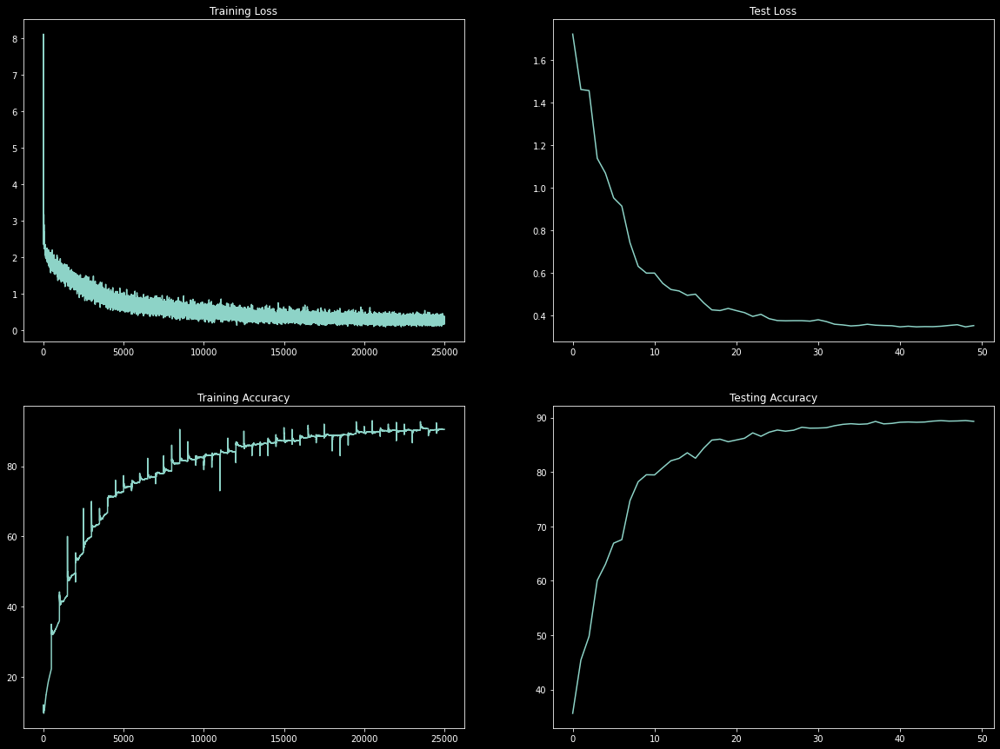

In [ ]:
import torch.optim as optim
from torch.optim.lr_scheduler import StepLR, ReduceLROnPlateau

train_loss = [] 
train_accuracy = []
test_loss = []
test_accuracy = []


optimizer = optim.SGD(net.parameters(), lr=0.2, momentum=0.9)
scheduler = StepLR(optimizer, step_size= 8, gamma= 0.5, verbose = True)

for epoch in range(50):  # loop over the dataset multiple times
    misclassified = []
    print(f'Epoch: {epoch+1}')
    train(net, device, trainloader, train_loss, train_accuracy, optimizer)
    test(net, device, testloader, test_loss, test_accuracy, misclassified)
    scheduler.step()



### Data Analytics and Visualization of model performance

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


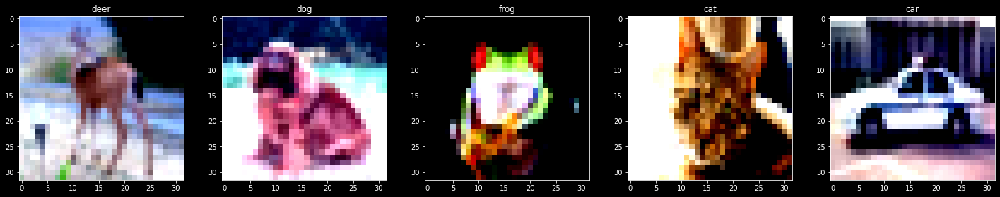

In [ ]:
dataiter = iter(testloader)
images, outputs = dataiter.next()
# print images
plot_images(dataiter, classes, total=5)

In [ ]:
outputs = net(images.to(device))

In [ ]:
_, predicted = torch.max(outputs, 1)

print('Predicted: ', ' '.join('%5s' % classes[predicted[j]]
                              for j in range(5)))

Predicted:    cat  ship  ship plane  frog


### Accuracy and Classwise performance of the model

In [ ]:
correct = 0
total = 0
with torch.no_grad():
    for data in testloader:
        images, labels = data[0].to(device), data[1].to(device)
        outputs = net(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

print('Accuracy of the network on the 10000 test images: %d %%' % (
    100 * correct / total))

Accuracy of the network on the 10000 test images: 89 %


In [ ]:
from util.classwise_performance import clswse_perf

clswse_perf(net, testloader, device, batch_size, classes)

Accuracy of plane : 92 %
Accuracy of   car : 95 %
Accuracy of  bird : 86 %
Accuracy of   cat : 80 %
Accuracy of  deer : 89 %
Accuracy of   dog : 76 %
Accuracy of  frog : 90 %
Accuracy of horse : 92 %
Accuracy of  ship : 94 %
Accuracy of truck : 94 %


### Misclassified Images
> Total of 25 misclassified images that the model in the last iteration failed to predict

---

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

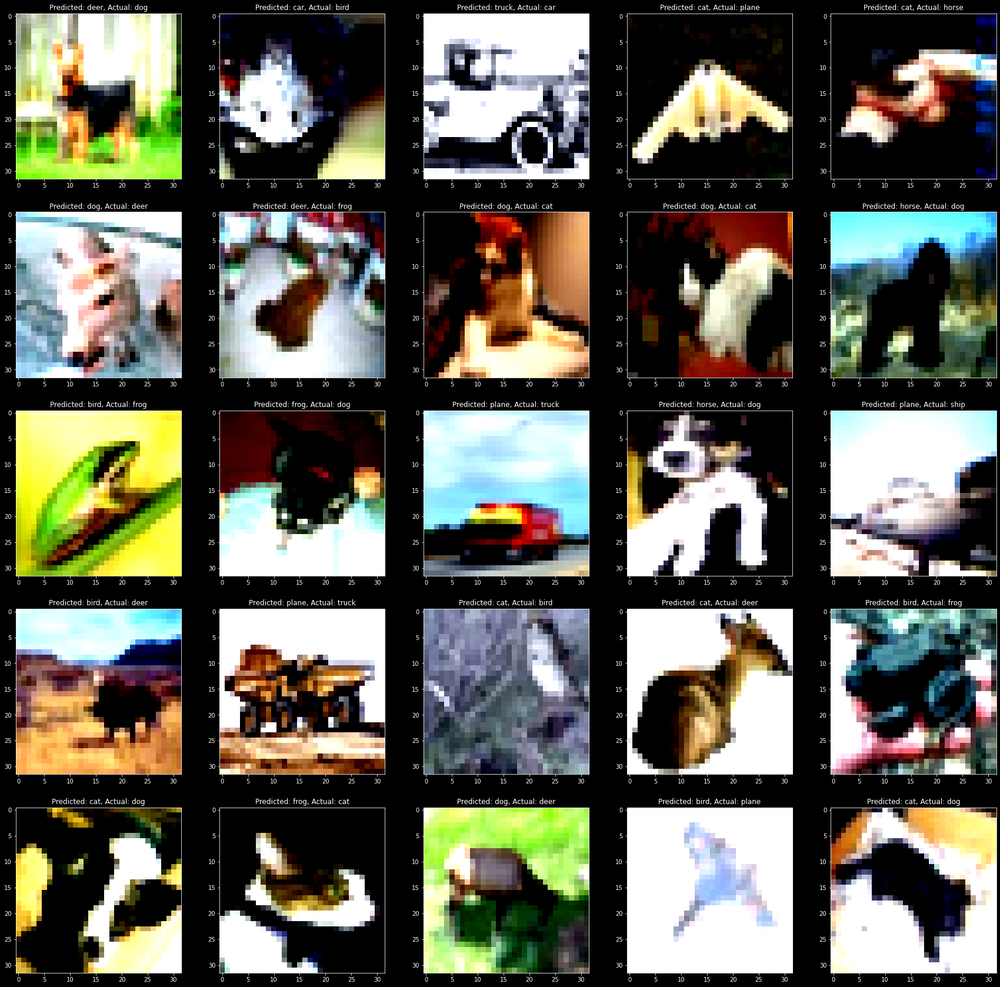

In [ ]:
# plotting misclassified images 
dataiter = iter(misclassified)

# print images
plot_images(dataiter, classes, total=25)

### GradCam report

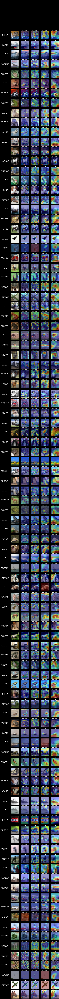

<Figure size 432x288 with 0 Axes>

In [ ]:
from analytics.gradcam.report_gen import generate_gradcam
generate_gradcam(net, testloader, device, target_layers, mean, std, classes)

In [ ]:
torch.save(net.state_dict(), 'resnet_cifar_89.30')